## Import the necessary packages

In [27]:
import numpy as np
import mrcfile
import matplotlib.pyplot as plt
import glob
import pandas as pd
import cupyx.scipy.ndimage as csnd
import arm_em

import matplotlib_scalebar.scalebar as mpss
import matplotlib.offsetbox as mploff

import cupy as cp
from tqdm.auto import trange

%matplotlib inline
%load_ext autoreload
%autoreload 2

plt.rcParams["image.cmap"] = "magma"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Clear the font cache, and use Source Family fonts

In [31]:
sc_font = {"weight": "regular", "size": 25}
tl_font = {"weight": "bold", "size": 25}

In [2]:
!rm -rf ~/.cache/matplotlib
from matplotlib import rcParams

rcParams["font.family"] = ["sans-serif"]
rcParams["font.sans-serif"] = ["Source Sans 3", "Source Sans Pro"]
rcParams["font.serif"] = ["Source Serif 4", "Source Serif Pro"]
rcParams["font.monospace"] = ["Source Code Pro"]
rcParams["font.size"] = 25

## Set up CuPy memory management

In [3]:
from rmm.allocators.cupy import rmm_cupy_allocator

cp.cuda.set_allocator(rmm_cupy_allocator)

## Let's test on a single datatset

In [4]:
top_level, file_dict = arm_em.file_params()

In [5]:
data_location = top_level + file_dict["data"]["PLGA"]["Exported"]
filetype = "mrc"
file_list = np.asarray(glob.glob(data_location + "*." + filetype), dtype="str")
data_mrc = mrcfile.open(file_list[2])

The data_mrc is the mrc file, where the data has the image, and the header the calibrations

### Load the data as a CuPy array, and plot it to see how it looks like.

In [6]:
im_data = data_mrc.data
summed_im = cp.array(np.sum(im_data, axis=0), dtype=cp.float64)

In [26]:
calib = data_mrc.voxel_size.x

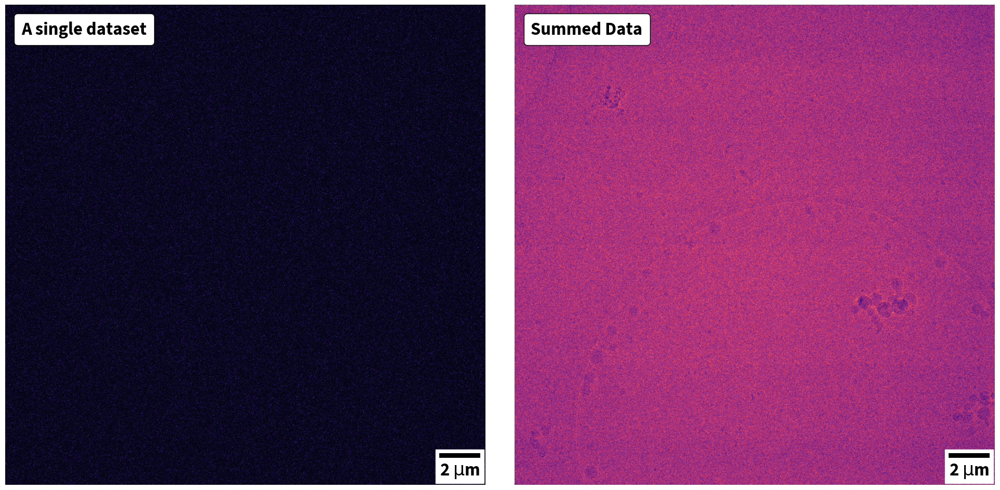

In [34]:
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(1 + im_data[100, :, :])
plt.axis("off")
scalebar = mpss.ScaleBar(
    calib, units="nm", location="lower right", font_properties=tl_font
)
plt.gca().add_artist(scalebar)
at = mploff.AnchoredText(
    "A single dataset", prop=tl_font, frameon=True, loc="upper left"
)
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
plt.gca().add_artist(at)

plt.subplot(1, 2, 2)
plt.imshow(summed_im.get())
plt.axis("off")
scalebar = mpss.ScaleBar(
    calib, units="nm", location="lower right", font_properties=tl_font
)
plt.gca().add_artist(scalebar)
at = mploff.AnchoredText("Summed Data", prop=tl_font, frameon=True, loc="upper left")
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
plt.gca().add_artist(at)

plt.tight_layout()

plt.savefig(top_level + file_dict["results"]["PLGA"] + "Single_vs_Summed.pdf")

#### As we observe, an individual frame has almost no signal, and we have to sum the individual frames together

In [15]:
top_level + file_dict["results"]["PLGA"]

'/achs/debangshu/Data/2024_ARM_Initiative/multi-particle-cryoem/data/results/figures_PLGA/'

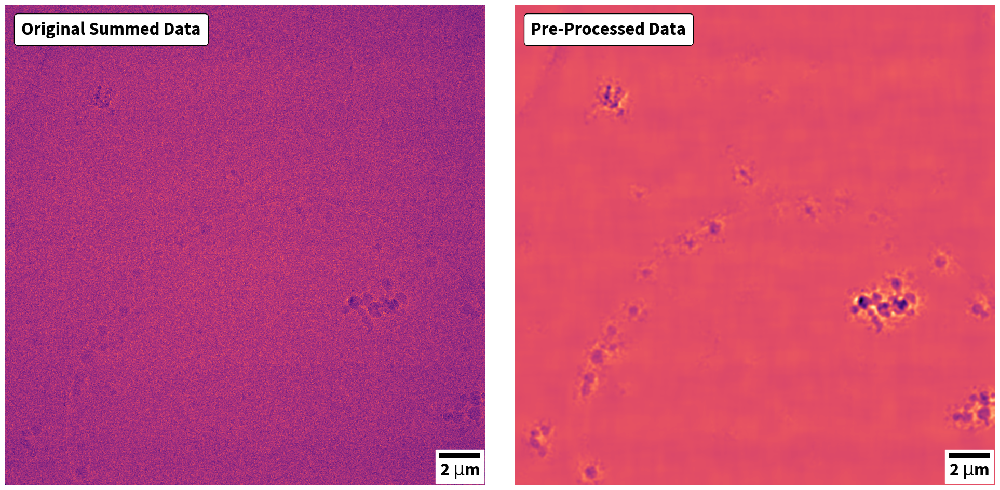

In [53]:
summed_im = (summed_im - cp.amin(summed_im)) / (cp.amax(summed_im) - cp.amin(summed_im))
preprocessed = arm_em.preprocessing(
    summed_im,
    exponential=True,
    gblur=5,
    background=50,
    apply_filter=101,
)

plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(summed_im.get())
plt.axis("off")
scalebar = mpss.ScaleBar(
    calib, units="nm", location="lower right", font_properties=tl_font
)
plt.gca().add_artist(scalebar)
at = mploff.AnchoredText(
    "Original Summed Data", prop=tl_font, frameon=True, loc="upper left"
)
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
plt.gca().add_artist(at)

plt.subplot(1, 2, 2)
plt.imshow(preprocessed.get())
plt.axis("off")
scalebar = mpss.ScaleBar(
    calib, units="nm", location="lower right", font_properties=tl_font
)
plt.gca().add_artist(scalebar)
at = mploff.AnchoredText(
    "Pre-Processed Data", prop=tl_font, frameon=True, loc="upper left"
)
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
plt.gca().add_artist(at)

plt.tight_layout()

plt.savefig(top_level + file_dict["results"]["PLGA"] + "Preprocessing.pdf")

### The arm package has the `Laplacian of Gaussian` function. Let's call it to see how fast it runs

In [54]:
%timeit arm_em.laplacian_gaussian(preprocessed, standard_deviation=15, sampling =(1/2))

13.4 ms ± 198 μs per loop (mean ± std. dev. of 7 runs, 100 loops each)


### Calling the function `JIT` compiles it, let's now run it on the image. We use some downsampling (`ds_factor`) to make it faster.

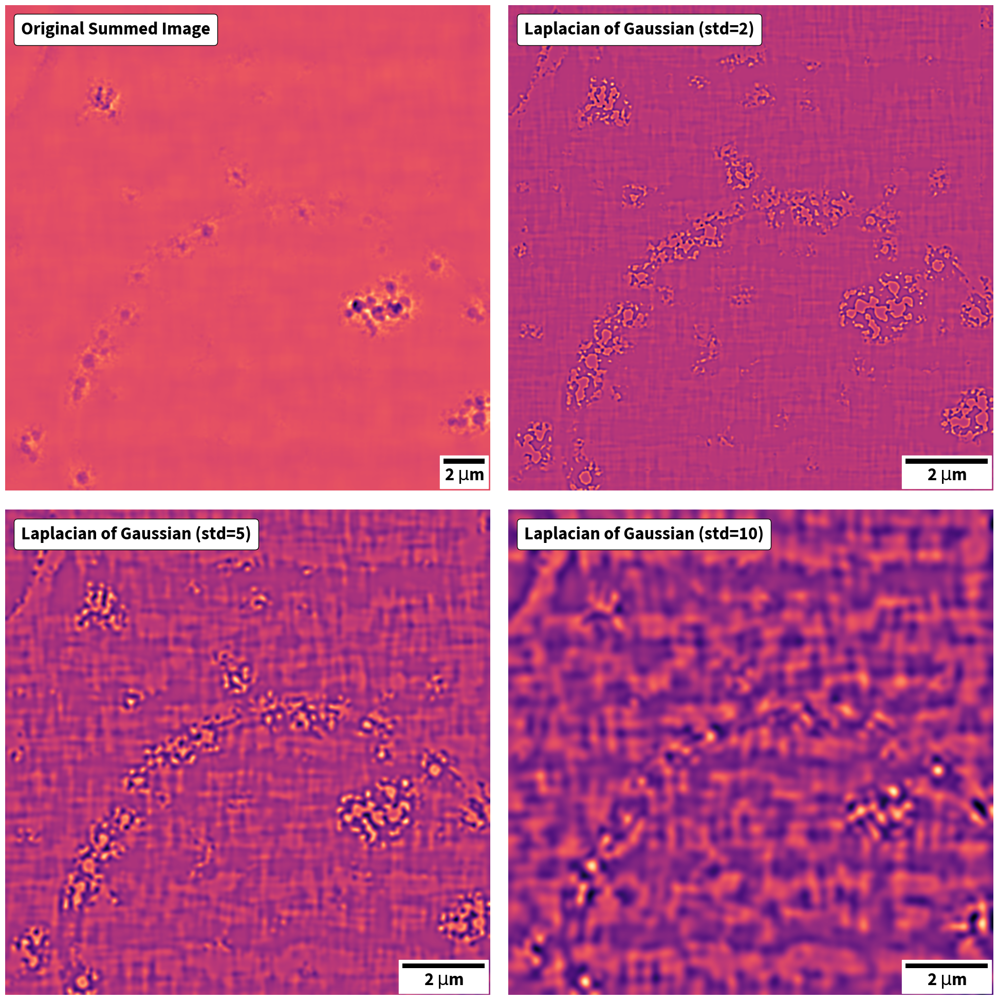

In [59]:
ds_factor = 2

plt.figure(figsize=(20, 20))
plt.subplot(2, 2, 1)
plt.imshow(preprocessed.get())
plt.axis("off")
scalebar = mpss.ScaleBar(
    calib, units="nm", location="lower right", font_properties=tl_font
)
plt.gca().add_artist(scalebar)
at = mploff.AnchoredText(
    "Original Summed Image", prop=tl_font, frameon=True, loc="upper left"
)
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
plt.gca().add_artist(at)


plt.subplot(2, 2, 2)
std_val = 2  # The Standard Deviation
plt.imshow(
    arm_em.laplacian_gaussian(
        preprocessed, standard_deviation=std_val, sampling=(1 / ds_factor)
    ).get()
)
plt.axis("off")
scalebar = mpss.ScaleBar(
    calib, units="nm", location="lower right", font_properties=tl_font
)
plt.gca().add_artist(scalebar)
at = mploff.AnchoredText(
    "Laplacian of Gaussian (std=" + str(std_val) + ")",
    prop=tl_font,
    frameon=True,
    loc="upper left",
)
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
plt.gca().add_artist(at)

plt.subplot(2, 2, 3)
std_val = 5  # The Standard Deviation
plt.imshow(
    arm_em.laplacian_gaussian(
        preprocessed, standard_deviation=std_val, sampling=(1 / ds_factor)
    ).get()
)
plt.axis("off")
scalebar = mpss.ScaleBar(
    calib, units="nm", location="lower right", font_properties=tl_font
)
plt.gca().add_artist(scalebar)
at = mploff.AnchoredText(
    "Laplacian of Gaussian (std=" + str(std_val) + ")",
    prop=tl_font,
    frameon=True,
    loc="upper left",
)
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
plt.gca().add_artist(at)


plt.subplot(2, 2, 4)
std_val = 10  # The Standard Deviation
plt.imshow(
    arm_em.laplacian_gaussian(
        preprocessed, standard_deviation=std_val, sampling=(1 / ds_factor)
    ).get()
)
plt.axis("off")
scalebar = mpss.ScaleBar(
    calib, units="nm", location="lower right", font_properties=tl_font
)
plt.gca().add_artist(scalebar)
at = mploff.AnchoredText(
    "Laplacian of Gaussian (std=" + str(std_val) + ")",
    prop=tl_font,
    frameon=True,
    loc="upper left",
)
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
plt.gca().add_artist(at)

plt.tight_layout()

plt.savefig(top_level + file_dict["results"]["PLGA"] + "Laplacian_of_Gaussian.pdf")

### Now, we will run the `arm_em.blob_list` to JIT compile it, and see how it runs through a series of Standard Deviations and locates the blobs

In [61]:
%timeit arm_em.blob_list(preprocessed, min_blob_size=1, max_blob_size=10, blob_step=1, downscale=2)

109 ms ± 6 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [62]:
calculated_blob_pos = arm_em.blob_list(
    preprocessed, min_blob_size=1, max_blob_size=10, blob_step=1, downscale=2
).get()
circle_test = np.zeros_like(summed_im.get())
yy, xx = np.mgrid[0 : circle_test.shape[0], 0 : circle_test.shape[1]]
for jj in trange(len(calculated_blob_pos)):
    circle_test += (
        ((yy - calculated_blob_pos[jj, 0]) ** 2)
        + ((xx - calculated_blob_pos[jj, 1]) ** 2)
    ) < (calculated_blob_pos[jj, 2] ** 2)
del yy, xx, jj

  0%|          | 0/382 [00:00<?, ?it/s]

### Let's plot the locations and sizes of the blobs. You will notice the blob sizes are still not correct!

In [ ]:
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(summed_im.get())
plt.scatter(calculated_blob_pos[:, 1], calculated_blob_pos[:, 0], c="k", s=1)
at = mploff.AnchoredText(
    "Centers",
    prop=tl_font,
    frameon=True,
    loc="upper left",
)
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
plt.gca().add_artist(at)
scalebar = mpss.ScaleBar(
    calib, units="nm", location="lower right", font_properties=tl_font
)
plt.gca().add_artist(scalebar)
plt.axis("off")


plt.subplot(1, 2, 2)
plt.imshow(circle_test)

scalebar = mpss.ScaleBar(
    calib, units="nm", location="lower right", font_properties=tl_font
)
plt.gca().add_artist(scalebar)
at = mploff.AnchoredText(
    "Circles",
    prop=tl_font,
    frameon=True,
    loc="upper left",
)
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
plt.gca().add_artist(at)
plt.axis("off")

plt.tight_layout()

plt.savefig(top_level + file_dict["results"]["PLGA"] + "Blob_Finding.pdf")

### Since we know the blobs can be calculated, let's run the code on the full folder. Here our function will go over the entire folder, and calculate blob sizes in nanometers for every MRC file in that folder.

In [ ]:
all_blobs = arm_em.folder_blobs(data_location)

  0%|          | 0/123 [00:00<?, ?it/s]

In [ ]:
hist_x, hist_y = np.histogram(np.asarray(all_blobs["Size (nm)"], dtype=float), bins=20)
hist_x, hist_y

(array([203, 151, 162, 165, 183, 182, 202, 214, 276, 253, 185, 246, 211,
        222, 203, 174, 156, 152, 123, 178]),
 array([   47.0845837 ,  1479.18765475,  2911.2907258 ,  4343.39379685,
         5775.4968679 ,  7207.59993894,  8639.70300999, 10071.80608104,
        11503.90915209, 12936.01222313, 14368.11529418, 15800.21836523,
        17232.32143628, 18664.42450733, 20096.52757837, 21528.63064942,
        22960.73372047, 24392.83679152, 25824.93986256, 27257.04293361,
        28689.14600466]))

#### Let's export this data as a CSV file to results

In [ ]:
all_blobs.to_csv(path_or_buf=top_level + file_dict["results"]["PLGA"] + "Blob_List.csv")